In [15]:
import os
import numpy as np
import pandas as pd
%matplotlib inline
import IPython.core.display         
# setup output image format (Chrome works best)
IPython.core.display.set_matplotlib_formats("svg")
import matplotlib.pyplot as plt
import matplotlib
from numpy import *
from sklearn import *
import xgboost as xgb
import pickle

In [9]:
data = pd.read_csv ('ot_top.csv',sep=',',dtype= np.float64)

In [3]:
a = data[data.columns[21]]
b = data[data.columns[1]]
c = data[data.columns[2]]
d = data[data.columns[3]]
e = data[data.columns[4]]
f = data[data.columns[5]]
g = data[data.columns[6]]
h = data[data.columns[7]]
i = data[data.columns[8]]
j = data[data.columns[9]]
k = data[data.columns[10]]
l = data[data.columns[11]]
m = data[data.columns[12]]
n = data[data.columns[13]]
o = data[data.columns[14]]
p = data[data.columns[15]]
q = data[data.columns[16]]
r = data[data.columns[17]]
s = data[data.columns[18]]
t = data[data.columns[19]]
u = data[data.columns[20]]
#print(u)

In [4]:
feat_labels=data.columns.values.tolist()[1:-1]
target = data.columns.values.tolist()[-1]
#print(feat_labels)

In [32]:
data = pd.read_csv ('out.csv',sep=',',dtype= np.float64)
data.dropna(inplace=True)

In [36]:
data = np.array(data)

X = data[:, 1:94]
Y = data[:, 94]

X = np.array(X)
Y = np.array(Y)

In [37]:
xtrain, xtest, trainY, testY = model_selection.train_test_split(X, Y, test_size = 0.3)

In [38]:
#Scaling of data
SS = preprocessing.StandardScaler()
xtrain = SS.fit_transform(xtrain)
xtest = SS.transform (xtest)

In [ ]:
RMSE = []
R2 = []
MAE = []
    
parameter = {'n_estimators': (5, 10, 50, 100, 500, 1000), 'loss': ('ls', 'lad', 'quantile', 'huber'), 
             'learning_rate':(0.001, 0.01, 0.05, 0.1, 0.3,0.5, 1.0), 'criterion': ('friedman_mse','mse', 'mae'), 
             'min_samples_split': (2, 3), 'max_depth': (5, 10, 20, 50), 'max_features': ('auto', 'sqrt', 'log2')}
GBaryl = model_selection.GridSearchCV(ensemble.GradientBoostingRegressor(),parameter, cv=5, n_jobs=-1)
GBaryl.fit(xtrain, trainY)
    
GBtest_rmse  = np.sqrt(metrics.mean_squared_error(testY, GBaryl.predict(xtest)))
GBtest_r2  = metrics.r2_score(testY, GBaryl.predict(xtest))
GBtest_mae  = metrics.mean_absolute_error(testY, GBaryl.predict(xtest))
    
RMSE.append(GBtest_rmse)  
R2.append(GBtest_r2)
MAE.append(GBtest_mae)
    
print('RMSE: ', min(RMSE), 'R2: ', max(R2), 'MAE: ', min(MAE))
print(GBaryl.best_params_)

In [ ]:
fig, ax = plt.subplots()
ax.scatter(testY, GBaryl.predict(xtest))
ax.plot([Y.min(), Y.max()], [Y.min(), Y.max()], 'k--', lw=4,)
ax.set_xlabel('Observed')
ax.set_ylabel('Predicted')
ax.set_title('Without Aryl Halides')
plt.savefig("No Aryl.eps", format="eps")
plt.savefig("No Aryl.jpg", format="jpg")
plt.show()

In [26]:
feature_names = [x[0] for x in X] 
target = Y


In [10]:
fig, ax = plt.subplots(5,4)

ax[0,0].scatter(a,b)
#ax[0,0].set_xlabel('Yield')
ax[0,0].set_ylabel('Descriptor')
ax[0,0].set_title(feat_labels[0])

ax[0,1].scatter(a,c)
#ax[0,1].set_xlabel('Yield')
ax[0,1].set_ylabel('Descriptor')
ax[0,1].set_title(feat_labels[1])

ax[0,2].scatter(a,d)
#ax[0,2].set_xlabel('Yield')
ax[0,2].set_ylabel('Descriptor')
ax[0,2].set_title(feat_labels[2])

ax[0,3].scatter(a,e)
#ax[0,3].set_xlabel('Yield')
ax[0,3].set_ylabel('Descriptor')
ax[0,3].set_title(feat_labels[3])

ax[1,0].scatter(a,f)
#ax[1,0].set_xlabel('Yield')
ax[1,0].set_ylabel('Descriptor')
ax[1,0].set_title(feat_labels[4])

ax[1,1].scatter(a,g)
#ax[1,1].set_xlabel('Yield')
ax[1,1].set_ylabel('Descriptor')
ax[1,1].set_title(feat_labels[5])

ax[1,2].scatter(a,h)
#ax[1,2].set_xlabel('Yield')
ax[1,2].set_ylabel('Descriptor')
ax[1,2].set_title(feat_labels[6])

ax[1,3].scatter(a,i)
#ax[1,3].set_xlabel('Yield')
ax[1,3].set_ylabel('Descriptor')
ax[1,3].set_title(feat_labels[7])

ax[2,0].scatter(a,j)
#ax[2,0].set_xlabel('Yield')
ax[2,0].set_ylabel('Descriptor')
ax[2,0].set_title(feat_labels[8])

ax[2,1].scatter(a,k)
#ax[2,1].set_xlabel('Yield')
ax[2,1].set_ylabel('Descriptor')
ax[2,1].set_title(feat_labels[9])

ax[2,2].scatter(a,l)
#ax[2,2].set_xlabel('Yield')
ax[2,2].set_ylabel('Descriptor')
ax[2,2].set_title(feat_labels[10])

ax[2,3].scatter(a,m)
#ax[2,3].set_xlabel('Yield')
ax[2,3].set_ylabel('Descriptor')
ax[2,3].set_title(feat_labels[11])

ax[3,0].scatter(a,n)
#ax[3,0].set_xlabel('Yield')
ax[3,0].set_ylabel('Descriptor')
ax[3,0].set_title(feat_labels[12])

ax[3,1].scatter(a,o)
#ax[3,1].set_xlabel('Yield')
ax[3,1].set_ylabel('Descriptor')
ax[3,1].set_title(feat_labels[13])

ax[3,2].scatter(a,p)
#ax[3,2].set_xlabel('Yield')
ax[3,2].set_ylabel('Descriptor')
ax[3,2].set_title(feat_labels[14])

ax[3,3].scatter(a,q)
#ax[3,3].set_xlabel('Yield')
ax[3,3].set_ylabel('Descriptor')
ax[3,3].set_title(feat_labels[15])

ax[4,0].scatter(a,r)
ax[4,0].set_xlabel('Yield')
ax[4,0].set_ylabel('Descriptor')
ax[4,0].set_title(feat_labels[16])

ax[4,1].scatter(a,s)
ax[4,1].set_xlabel('Yield')
ax[4,1].set_ylabel('Descriptor')
ax[4,1].set_title(feat_labels[17])

ax[4,2].scatter(a,t)
ax[4,2].set_xlabel('Yield')
ax[4,2].set_ylabel('Descriptor')
ax[4,2].set_title(feat_labels[18])

ax[4,3].scatter(a,u)
ax[4,3].set_xlabel('Yield')
ax[4,3].set_ylabel('Descriptor')
ax[4,3].set_title(feat_labels[19])

plt.show()

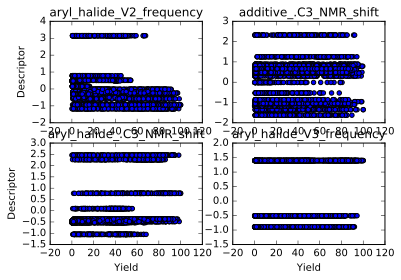

In [7]:
fig, ax = plt.subplots(2,2)

ax[0,0].scatter(a,o)
#ax[0,0].set_xlabel('Yield')
ax[0,0].set_ylabel('Descriptor')
ax[0,0].set_title(feat_labels[12])

ax[0,1].scatter(a,b)
#ax[0,1].set_xlabel('Yield')
#ax[0,1].set_ylabel('Descriptor')
ax[0,1].set_title(feat_labels[0])

ax[1,0].scatter(a,k)
ax[1,0].set_xlabel('Yield')
ax[1,0].set_ylabel('Descriptor')
ax[1,0].set_title(feat_labels[9])

ax[1,1].scatter(a,p)
ax[1,1].set_xlabel('Yield')
#ax[1,1].set_ylabel('Descriptor')
ax[1,1].set_title(feat_labels[13])

plt.show()

In [91]:
data = pd.read_csv ('outligands.csv',sep=',',dtype= np.float64)
data.dropna(inplace=True)

In [92]:
#without ligands
X = data.iloc[:, 1:57]
Y = data.iloc[:, 57]

X = np.array(X)
Y = np.array(Y)

In [93]:
xtrain, xtest, trainY, testlig = model_selection.train_test_split(X, Y, test_size = 0.3)

In [94]:
#Scaling of data
SS = preprocessing.StandardScaler()
xtrain = SS.fit_transform(xtrain)
xtest = SS.transform (xtest)

In [95]:
RMSE = []
R2 = []
MAE = []
    
parameter = {'n_estimators': [1000], 'loss': ['ls'], 'learning_rate':[0.01], 'criterion': ['friedman_mse'], 
             'min_samples_split':  [3], 'max_depth': [10], 'max_features': ['sqrt']}
GBlig = model_selection.GridSearchCV(ensemble.GradientBoostingRegressor(),parameter, cv=5, n_jobs=-1)
GBlig.fit(xtrain, trainY)
    
C = GBlig.predict(xtest)
GBtest_rmse  = np.sqrt(metrics.mean_squared_error(testlig, C))
GBtest_r2  = metrics.r2_score(testlig, C)
GBtest_mae  = metrics.mean_absolute_error(testlig, C)
    
RMSE.append(GBtest_rmse)  
R2.append(GBtest_r2)
MAE.append(GBtest_mae)
    
print('RMSE: ', min(RMSE), 'R2: ', max(R2), 'MAE: ', min(MAE))
print(GBlig.best_params_)

RMSE:  18.0468274143 R2:  0.547255744922 MAE:  12.4869323469
{'n_estimators': 1000, 'min_samples_split': 3, 'max_features': 'sqrt', 'learning_rate': 0.01, 'criterion': 'friedman_mse', 'loss': 'ls', 'max_depth': 10}


In [96]:
import csv

In [97]:
pd.DataFrame(GBlig.predict(xtest), columns=['Yield']).to_csv('GBlig.csv')

In [98]:
data = pd.read_csv ('outaryl.csv',sep=',',dtype= np.float64)
data.dropna(inplace=True)

In [99]:
#without arylhalides
X = data.iloc[:, 1:94]
Y = data.iloc[:, 94]

X = np.array(X)
Y = np.array(Y)

In [100]:
xtrain, xtest, trainY, testaryl = model_selection.train_test_split(X, Y, test_size = 0.3)

In [101]:
#Scaling of data
SS = preprocessing.StandardScaler()
xtrain = SS.fit_transform(xtrain)
xtest = SS.transform (xtest)

In [102]:
RMSE = []
R2 = []
MAE = []
    
parameter = {'n_estimators': [1000], 'loss': ['ls'], 'learning_rate':[0.01], 'criterion': ['friedman_mse'], 
             'min_samples_split':  [3], 'max_depth': [10], 'max_features': ['sqrt']}
GBaryl = model_selection.GridSearchCV(ensemble.GradientBoostingRegressor(),parameter, cv=5, n_jobs=-1)
GBaryl.fit(xtrain, trainY)

A = GBaryl.predict(xtest)
GBtest_rmse  = np.sqrt(metrics.mean_squared_error(testaryl, A))
GBtest_r2  = metrics.r2_score(testaryl, A)
GBtest_mae  = metrics.mean_absolute_error(testaryl, A)
    
RMSE.append(GBtest_rmse)  
R2.append(GBtest_r2)
MAE.append(GBtest_mae)
    
print('RMSE: ', min(RMSE), 'R2: ', max(R2), 'MAE: ', min(MAE))
print(GBaryl.best_params_)

RMSE:  25.2518336483 R2:  0.139775984079 MAE:  19.7287864324
{'n_estimators': 1000, 'min_samples_split': 3, 'max_features': 'sqrt', 'learning_rate': 0.01, 'criterion': 'friedman_mse', 'loss': 'ls', 'max_depth': 10}


In [103]:
pd.DataFrame(GBaryl.predict(xtest), columns=['Yield']).to_csv('GBaryl.csv')

In [104]:
data = pd.read_csv ('outbase.csv',sep=',',dtype= np.float64)
data.dropna(inplace=True)

In [105]:
#without base
X = data.iloc[:, 1:111]
Y = data.iloc[:, 111]

X = np.array(X)
Y = np.array(Y)

In [106]:
xtrain, xtest, trainY, testbase = model_selection.train_test_split(X, Y, test_size = 0.3)

In [107]:
#Scaling of data
SS = preprocessing.StandardScaler()
xtrain = SS.fit_transform(xtrain)
xtest = SS.transform (xtest)

In [108]:
RMSE = []
R2 = []
MAE = []
    
parameter = {'n_estimators': [1000], 'loss': ['ls'], 'learning_rate':[0.01], 'criterion': ['friedman_mse'], 
             'min_samples_split':  [3], 'max_depth': [10], 'max_features': ['sqrt']}
GBbase = model_selection.GridSearchCV(ensemble.GradientBoostingRegressor(),parameter, cv=5, n_jobs=-1)
GBbase.fit(xtrain, trainY)
    
B = GBbase.predict(xtest)
GBtest_rmse  = np.sqrt(metrics.mean_squared_error(testbase, B))
GBtest_r2  = metrics.r2_score(testbase, B)
GBtest_mae  = metrics.mean_absolute_error(testbase, B)
    
RMSE.append(GBtest_rmse)  
R2.append(GBtest_r2)
MAE.append(GBtest_mae)
    
print('RMSE: ', min(RMSE), 'R2: ', max(R2), 'MAE: ', min(MAE))
print(GBbase.best_params_)

RMSE:  19.5377956457 R2:  0.47884201271 MAE:  12.9763567421
{'n_estimators': 1000, 'min_samples_split': 3, 'max_features': 'sqrt', 'learning_rate': 0.01, 'criterion': 'friedman_mse', 'loss': 'ls', 'max_depth': 10}


In [109]:
pd.DataFrame(GBbase.predict(xtest), columns=['Yield']).to_csv('GBbase.csv')

In [110]:
data = pd.read_csv ('outadd.csv',sep=',',dtype= np.float64)
data.dropna(inplace=True)

In [111]:
#without additives
X = data.iloc[:, 1:102]
Y = data.iloc[:, 102]

X = np.array(X)
Y = np.array(Y)

In [112]:
xtrain, xtest, trainY, testadd = model_selection.train_test_split(X, Y, test_size = 0.3)

In [113]:
#Scaling of data
SS = preprocessing.StandardScaler()
xtrain = SS.fit_transform(xtrain)
xtest = SS.transform (xtest)

In [114]:
RMSE = []
R2 = []
MAE = []
    
parameter = {'n_estimators': [1000], 'loss': ['ls'], 'learning_rate':[0.01], 'criterion': ['friedman_mse'], 
             'min_samples_split':  [3], 'max_depth': [10], 'max_features': ['sqrt']}
GBadd = model_selection.GridSearchCV(ensemble.GradientBoostingRegressor(),parameter, cv=5, n_jobs=-1)
GBadd.fit(xtrain, trainY)
    
D = GBadd.predict(xtest)
GBtest_rmse  = np.sqrt(metrics.mean_squared_error(testadd, D))
GBtest_r2  = metrics.r2_score(testadd, D)
GBtest_mae  = metrics.mean_absolute_error(testadd, D)
    
RMSE.append(GBtest_rmse)  
R2.append(GBtest_r2)
MAE.append(GBtest_mae)
    
print('RMSE: ', min(RMSE), 'R2: ', max(R2), 'MAE: ', min(MAE))
print(GBadd.best_params_)

RMSE:  16.9209317482 R2:  0.598984542694 MAE:  12.5852023476
{'n_estimators': 1000, 'min_samples_split': 3, 'max_features': 'sqrt', 'learning_rate': 0.01, 'criterion': 'friedman_mse', 'loss': 'ls', 'max_depth': 10}


In [115]:
pd.DataFrame(GBadd.predict(xtest), columns=['Yield']).to_csv('GBadd.csv')

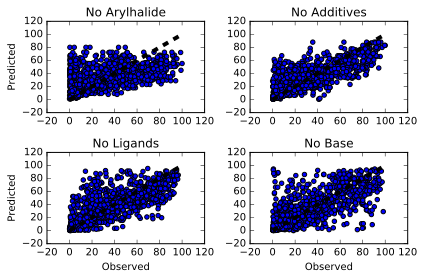

In [117]:
fig, ax = plt.subplots(2,2)
ax[0,0].scatter(testaryl, A)
ax[0,0].plot([Y.min(), Y.max()], [Y.min(), Y.max()], 'k--', lw=4)
ax[0,0].set_ylabel('Predicted')
ax[0,0].set_title('No Arylhalide')

ax[0,1].scatter(testadd, D)
ax[0,1].plot([Y.min(), Y.max()], [Y.min(), Y.max()], 'k--', lw=4,)
ax[0,1].set_title('No Additives')

ax[1,0].scatter(testlig, C)
ax[1,0].plot([Y.min(), Y.max()], [Y.min(), Y.max()], 'k--', lw=4,)
ax[1,0].set_xlabel('Observed')
ax[1,0].set_ylabel('Predicted')
ax[1,0].set_title('No Ligands')

ax[1,1].scatter(testbase, B)
ax[1,1].plot([Y.min(), Y.max()], [Y.min(), Y.max()], 'k--', lw=4,)
ax[1,1].set_xlabel('Observed')
ax[1,1].set_title('No Base')

fig.tight_layout()
plt.savefig("WithoutAll.eps", format="eps")
plt.savefig("WithoutAll.jpg", format="png", dpi = 300)    
plt.show()